
# HoughCircles Parameter Tester (Embryo Bronze Dataset)

This minimal notebook helps you iterate on OpenCV's `HoughCircles` parameters using images from the **bronze** dataset.

**Assumptions & paths**  
- Project root (you): `thesis/`  
- Bronze images: `thesis/data/embryo_dataset_bronze/<embryo_id>/*.jpg|*.jpeg|*.png`  
- This notebook expects to be run from the project root (or update the `DATASET_ROOT` below).

**What it does**  
- Samples N images from the bronze dataset.  
- Runs `cv2.HoughCircles` with the parameters you set.  
- Visualizes detections (green circle + center) and optionally **saves overlays** to disk.  
- **New:** Prints, for each image, the `(x, y, r)` of every detected circle **under the plot**, plus simple radius stats.


In [355]:

# If OpenCV is missing, install a headless build
import cv2

import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import random, glob, os, math, textwrap
%matplotlib inline


In [356]:

# === Paths & Sampling ===
# Set this to your project bronze folder (relative to where you run the notebook)
DATASET_ROOT = Path("../data/embryo_dataset_bronze")

# File extensions to consider
EXT = ".jpeg"

# How many images to sample per run (set to None to use all — not recommended for quick testing)
SAMPLE_N = 60
RANDOM_SEED = 42

# Where to save overlays (set SAVE_OVERLAYS=True below to enable)
OUTPUT_DIR = Path("hough_overlays")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# Recursively gather images
all_imgs = [Path(p) for p in glob.glob(str(DATASET_ROOT / "**" / "*"), recursive=True) if p.lower().endswith(EXT)]
print(f"Found {len(all_imgs)} images under {DATASET_ROOT}")

if SAMPLE_N is not None and len(all_imgs) > SAMPLE_N:
    random.Random(RANDOM_SEED).shuffle(all_imgs)
    imgs = all_imgs[:SAMPLE_N]
else:
    imgs = all_imgs

print(f"Using {len(imgs)} images for this run")


Found 443557 images under ../data/embryo_dataset_bronze
Using 60 images for this run


In [357]:

# === HoughCircles Parameters ===
# cv2.HoughCircles with method=cv2.HOUGH_GRADIENT
# Key knobs to tweak: param2 (accumulator threshold), minRadius, maxRadius

DP = 1.2            # Inverse ratio of accumulator resolution to image resolution
MIN_DIST = 350       # Minimum distance between circle centers
PARAM1 = 50        # Upper threshold for Canny edge detector
PARAM2 = 0.60         # Accumulator threshold for circle centers (smaller -> more detections)
MIN_RADIUS = 0     # Minimum circle radius (in pixels)
MAX_RADIUS = 0    # Maximum circle radius (in pixels)

# === Preprocessing ===
DO_CLAHE = True         # Contrast Limited Adaptive Histogram Equalization
CLAHE_CLIP = 2.0
CLAHE_TILE = (8, 8)

DO_GAUSS_BLUR = True
GAUSS_KSIZE = 7         # must be odd
GAUSS_SIGMA = 1.5

# Print per-image circle details beneath the figure?
PRINT_DETAILS = True


In [358]:

def read_gray(path):
    img = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise RuntimeError(f"Could not read image: {path}")
    return img

def preprocess(gray):
    g = gray.copy()
    if DO_CLAHE:
        clahe = cv2.createCLAHE(clipLimit=CLAHE_CLIP, tileGridSize=CLAHE_TILE)
        g = clahe.apply(g)
    if DO_GAUSS_BLUR:
        k = GAUSS_KSIZE if GAUSS_KSIZE % 2 == 1 else GAUSS_KSIZE + 1
        g = cv2.GaussianBlur(g, (k, k), GAUSS_SIGMA)
    return g

def detect_circles(gray):
    # Expect grayscale uint8
    circles = cv2.HoughCircles(
        gray,
        cv2.HOUGH_GRADIENT_ALT,
        dp=DP,
        minDist=MIN_DIST,
        param1=PARAM1,
        param2=PARAM2,
        minRadius=MIN_RADIUS,
        maxRadius=MAX_RADIUS
    )
    if circles is not None:
        circles = np.uint16(np.around(circles))[0, :]  # shape [N, 3] -> (x,y,r)
    return circles

def draw_circles(gray, circles):
    # Convert to BGR for colored overlays
    vis = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)
    if circles is not None:
        for (x, y, r) in circles:
            cv2.circle(vis, (int(x), int(y)), int(r), (0, 255, 0), 2)   # green circle
            cv2.circle(vis, (int(x), int(y)), 2, (0, 0, 255), 3)       # red center
    return vis

def details_text(image_path, circles):
    lines = []
    header = f"Image: {image_path.parent.name}/{image_path.name}"
    lines.append(header)
    n = 0 if circles is None else len(circles)
    lines.append(f"Detections: {n}")
    if n > 0:
        lines.append("x	y	r")
        for (x, y, r) in circles:
            lines.append(f"{int(x)}	{int(y)}	{int(r)}")
        rs = [int(r) for (_, _, r) in circles]
        lines.append(f"r_mean={np.mean(rs):.2f}, r_median={np.median(rs):.2f}, r_min={np.min(rs)}, r_max={np.max(rs)}")
    return "\n".join(lines)


Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file


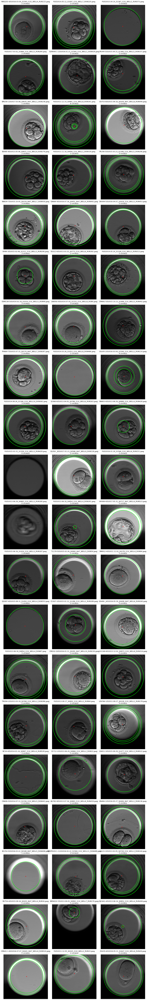

Image: MAS203-4/D2016.03.04_S1593_I132_WELL4_RUN115.jpeg
Detections: 2
x	y	r
262	244	200
262	244	181
r_mean=190.50, r_median=190.50, r_min=181, r_max=200
------------------------------------------------------------
Image: F0/D2014.05.12_S1097_I132_WELL7_RUN220.jpeg
Detections: 3
x	y	r
242	254	235
242	254	192
242	254	211
r_mean=212.67, r_median=211.00, r_min=192, r_max=235
------------------------------------------------------------
Image: F0/D2015.04.14_S1367_I132_WELL2_RUN373.jpeg
Detections: 1
x	y	r
248	241	212
r_mean=212.00, r_median=212.00, r_min=212, r_max=212
------------------------------------------------------------


Premature end of JPEG file
Premature end of JPEG file


Image: F0/D2017.03.02_S1866_I132_WELL5_RUN284.jpeg
Detections: 2
x	y	r
250	245	207
250	245	188
r_mean=197.50, r_median=197.50, r_min=188, r_max=207
------------------------------------------------------------
Image: SLM044-1-1/D2016.01.21_S1560_I132_WELL1_RUN429.jpeg
Detections: 1
x	y	r
282	235	199
r_mean=199.00, r_median=199.00, r_min=199, r_max=199
------------------------------------------------------------
Image: FA344-5/D2015.04.15_S1368_I132_WELL5_RUN337.jpeg
Detections: 2
x	y	r
247	212	216
247	212	188
r_mean=202.00, r_median=202.00, r_min=188, r_max=216
------------------------------------------------------------
Image: BM256-1/D2017.03.08_S0635_I647_WELL1_RUN238.jpeg
Detections: 1
x	y	r
260	263	207
r_mean=207.00, r_median=207.00, r_min=207, r_max=207
------------------------------------------------------------
Image: F0/D2013.12.14_S0981_I132_WELL8_RUN191.jpeg
Detections: 6
x	y	r
252	241	213
252	241	237
252	241	187
252	241	170
252	241	32
252	241	22
r_mean=143.50, r_median=178.5

Premature end of JPEG file
Premature end of JPEG file


Image: HH569-4/D2017.05.31_S0717_I647_WELL4_RUN523.jpeg
Detections: 2
x	y	r
252	245	206
252	245	182
r_mean=194.00, r_median=194.00, r_min=182, r_max=206
------------------------------------------------------------
Image: F0/D2015.06.16_S1416_I132_WELL3_RUN187.jpeg
Detections: 1
x	y	r
248	242	202
r_mean=202.00, r_median=202.00, r_min=202, r_max=202
------------------------------------------------------------
Image: TL179-5/D2015.02.26_S0060_I647_WELL5_RUN54.jpeg
Detections: 1
x	y	r
238	230	228
r_mean=228.00, r_median=228.00, r_min=228, r_max=228
------------------------------------------------------------
Image: MM912-4/D2011.11.02_S0278_I132_WELL4_RUN94.jpeg
Detections: 1
x	y	r
247	240	204
r_mean=204.00, r_median=204.00, r_min=204, r_max=204
------------------------------------------------------------
Image: QC697-4/D2015.08.31_S1450_I132_WELL4_RUN553.jpeg
Detections: 1
x	y	r
242	242	210
r_mean=210.00, r_median=210.00, r_min=210, r_max=210
----------------------------------------------

In [359]:

ncols = 3
nrows = math.ceil(len(imgs) / ncols)
figsize = (ncols * 5, nrows * 5)

fig = plt.figure(figsize=figsize)
for i, p in enumerate(imgs):
    gray = read_gray(p)
    proc = preprocess(gray)
    circles = detect_circles(proc)
    vis = draw_circles(gray, circles)
    
    ax = fig.add_subplot(nrows, ncols, i+1)
    ax.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    ax.set_title(f"{p.parent.name}/{p.name}\n{len(circles) if circles is not None else 0} circle(s)")
    ax.axis("off")

plt.tight_layout()
plt.show()

# --- Print details under the figure (one block per image) ---
if PRINT_DETAILS:
    for p in imgs:
        gray = read_gray(p)
        proc = preprocess(gray)
        circles = detect_circles(proc)
        print(details_text(p, circles))
        print("-" * 60)
